# Применение вероятностного преобразования Хафа для алгоритма поиска лесных просек

После получения обученной на пикселях выборки модели логистической регрессии и ее сохранения в файл модели необходимо отделить выделенные этой моделью класс низкорослой растительности и найти линейные структуры на маске низкорослой растительности. Для этой задачи применяется вероятностное преобразование Хафа.

## Импорт библиотек и дополнительные установки

In [ ]:
import warnings
import os
from osgeo import osr, gdal
import rasterio.shutil
import rioxarray as rxr
import matplotlib.pyplot as plt
import seaborn as sns

from clearings_extraction_algorithm import (
    ImageDataset,
    LandClassModel,
    ClearingsExtractor,
    find_clearing_algorithm,
)

In [ ]:
warnings.filterwarnings("ignore")
gdal.UseExceptions()
gdal.AllRegister()

In [ ]:
%matplotlib inline
sns.set_style("ticks")

## Подтоговка наборов данных на экспериментальные участки и получение карт классификации

In [ ]:
summer_images = [
    r".\images\experimental_areas_images\small_areas_images\sentinel2_2016_06_1_1.tif",
    r".\images\experimental_areas_images\small_areas_images\sentinel2_2016_06_2_1.tif",
    r".\images\experimental_areas_images\small_areas_images\sentinel2_2020_06_3_1.tif",
]

winter_images = [
    r".\images\experimental_areas_images\small_areas_images\sentinel2_2017_01_1_1.tif",
    r".\images\experimental_areas_images\small_areas_images\sentinel2_2017_01_2_1.tif",
    r".\images\experimental_areas_images\small_areas_images\sentinel2_2017_02_3_1.tif",
]

image_datasets = []

In [ ]:
for summer_image, winter_image in zip(summer_images, winter_images):
    image_dataset = ImageDataset()
    image_dataset.create_dataset(summer_image, winter_image)
    image_dataset.make_image_2d()
    image_datasets.append(image_dataset)

In [ ]:
land_class_maps = []

model = LandClassModel(model_name="", model_path=r".\model\logistic_regression.joblib")
for image in image_datasets:
    pred_map = model.predict_for_image(image.image_data_2d_arr, image.image_data_3d)
    land_class_maps.append(pred_map)

## Извлечение лесных просек под ЛЭП с помощью вероятностного преобразования Хафа

Алгоритм извлечения линейных объектов из маски лугов карты классификации состоит из следующих шагов:

1) Извлечение класса низкорослой растительности из карты классификации модели логрегрессии
2) Применение гауссового фильтра с параметром `sigma=5` для искажения формы выделенных объектов. При этом лесные просеки все также остаются линейными. Путем применение порогового значения 0.5 приводим маску в бинарный вид
3) Извлечение краев с полученного на шаге 2 результата с помощью оконной функции: если значение данного пикселя равно единице и если среди восьми окружающих пикселей есть хотя бы один пиксель с нулевым значением, то пиксель остается. Остальные пиксели убираются.
4) Применение вероятностного преобразования Хафа на полученной маске границ объектов и растеризация выделенных линий. В итоге остаются лесные просеки под ЛЭП.

Извлечем лесные просеки для трех экспериментальных участков:

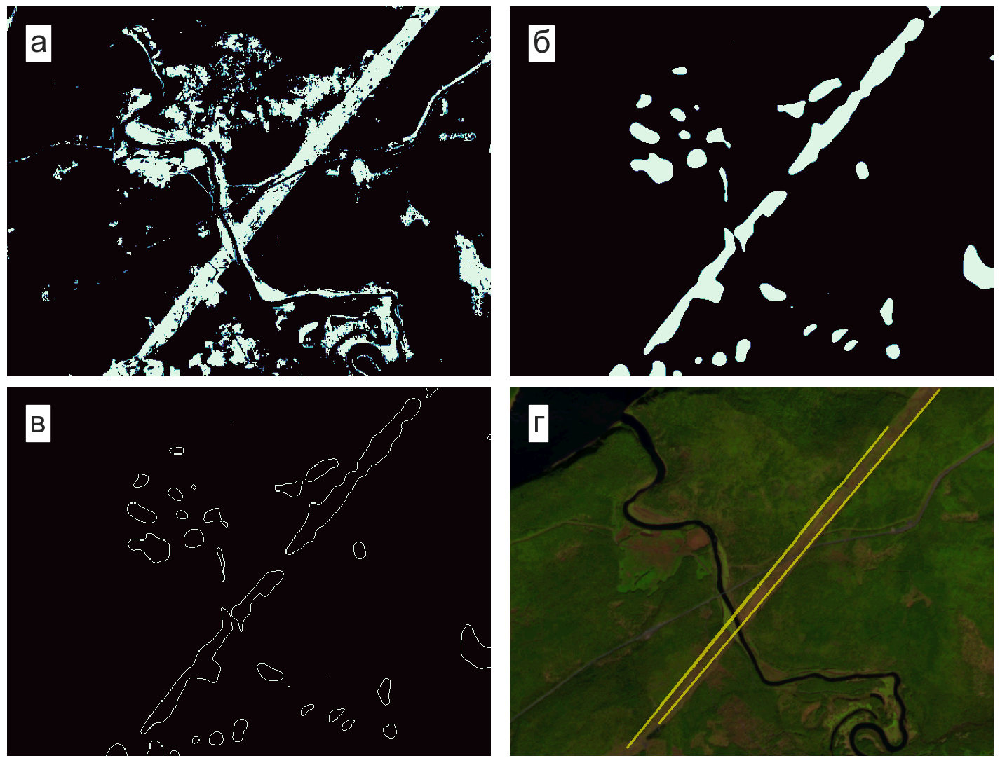

In [ ]:
clearings_extractor_1 = ClearingsExtractor()
fig = clearings_extractor_1.visualize_algorithm_steps(
    land_class_maps[0], summer_images[0]
)

file_name = "algorithm_steps_1.svg"
file_path = os.path.join("svg_plots", file_name)
fig.savefig(file_path, format="svg", dpi=300, bbox_inches="tight")
plt.tight_layout()

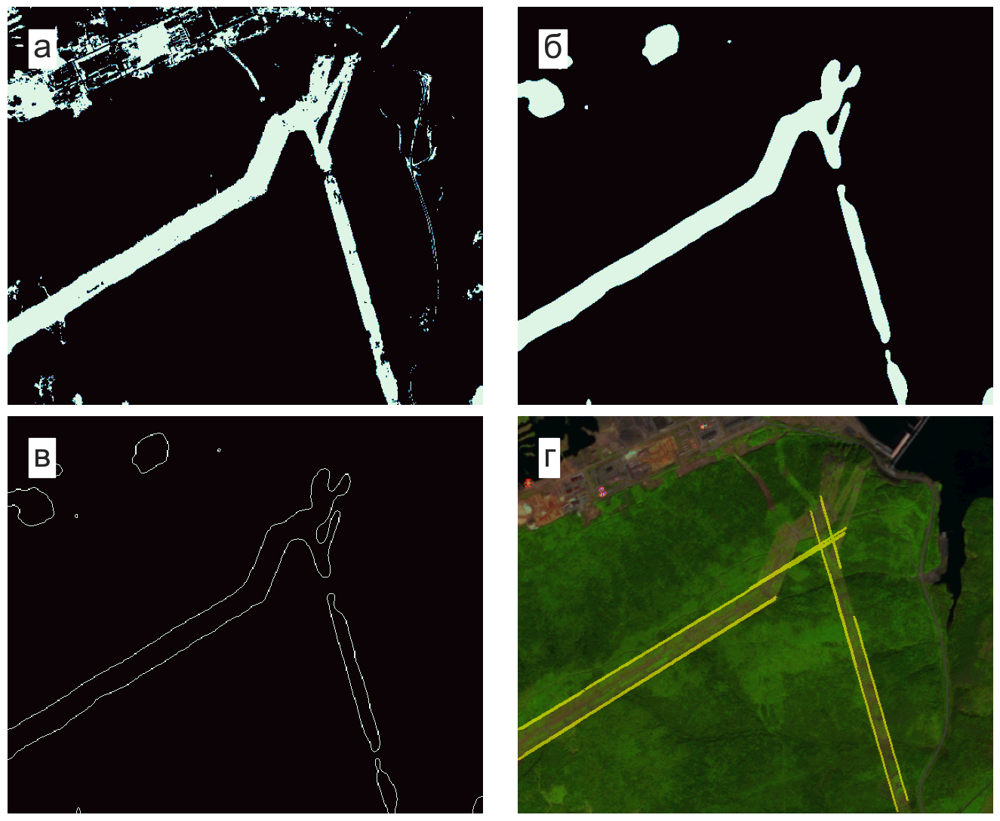

In [ ]:
clearings_extractor_2 = ClearingsExtractor()
fig = clearings_extractor_2.visualize_algorithm_steps(
    land_class_maps[1], summer_images[1]
)

file_name = "algorithm_steps_2.svg"
file_path = os.path.join("svg_plots", file_name)
fig.savefig(file_path, format="svg", dpi=300, bbox_inches="tight")
plt.tight_layout()

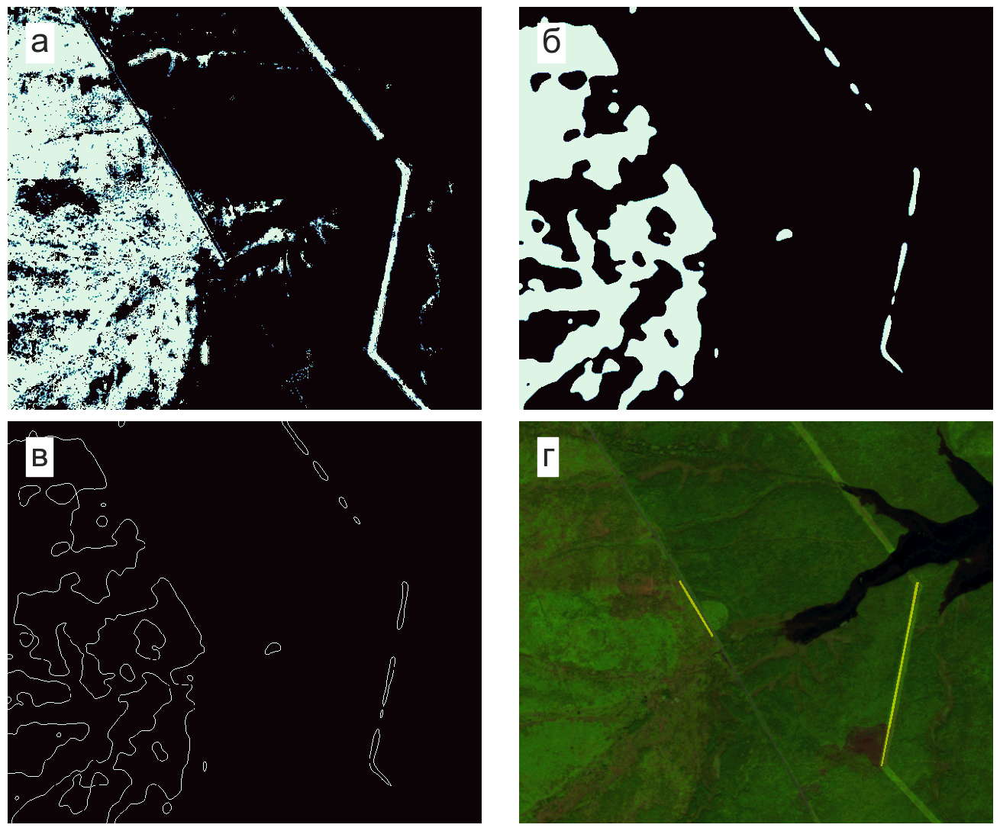

In [ ]:
clearings_extractor_3 = ClearingsExtractor()
fig = clearings_extractor_3.visualize_algorithm_steps(
    land_class_maps[2], summer_images[2]
)

file_name = "algorithm_steps_3.svg"
file_path = os.path.join("svg_plots", file_name)
fig.savefig(file_path, format="svg", dpi=300, bbox_inches="tight")
plt.tight_layout()

Для дальнейшего тестирования результатов были использованы снимки расширенных тестовых участков № 1, 2 и 3:

In [ ]:
big_summer_images = [
    r".\images\experimental_areas_images\big_areas_images\sentinel2_2020_06_1_2.tif",
    r".\images\experimental_areas_images\big_areas_images\sentinel2_2020_06_2_2.tif",
    r".\images\experimental_areas_images\big_areas_images\sentinel2_2020_06_3_2.tif",
]

big_winter_images = [
    r".\images\experimental_areas_images\big_areas_images\sentinel2_2017_01_1_2.tif",
    r".\images\experimental_areas_images\big_areas_images\sentinel2_2018_02_2_2.tif",
    r".\images\experimental_areas_images\big_areas_images\sentinel2_2017_02_3_2.tif",
]

In [ ]:
big_logreg_pred_maps = []

for summer_image, winter_image in zip(big_summer_images, big_winter_images):
    image_dataset = ImageDataset()
    image_dataset.create_dataset(summer_image, winter_image)
    image_dataset.make_image_2d()
    logreg_pred_map = model.predict_for_image(
        image_dataset.image_data_2d_arr, image_dataset.image_data_3d
    )
    big_logreg_pred_maps.append(logreg_pred_map)

Ниже приведены результаты выделения лесных просек под ЛЭП на территориях расширенных участков:

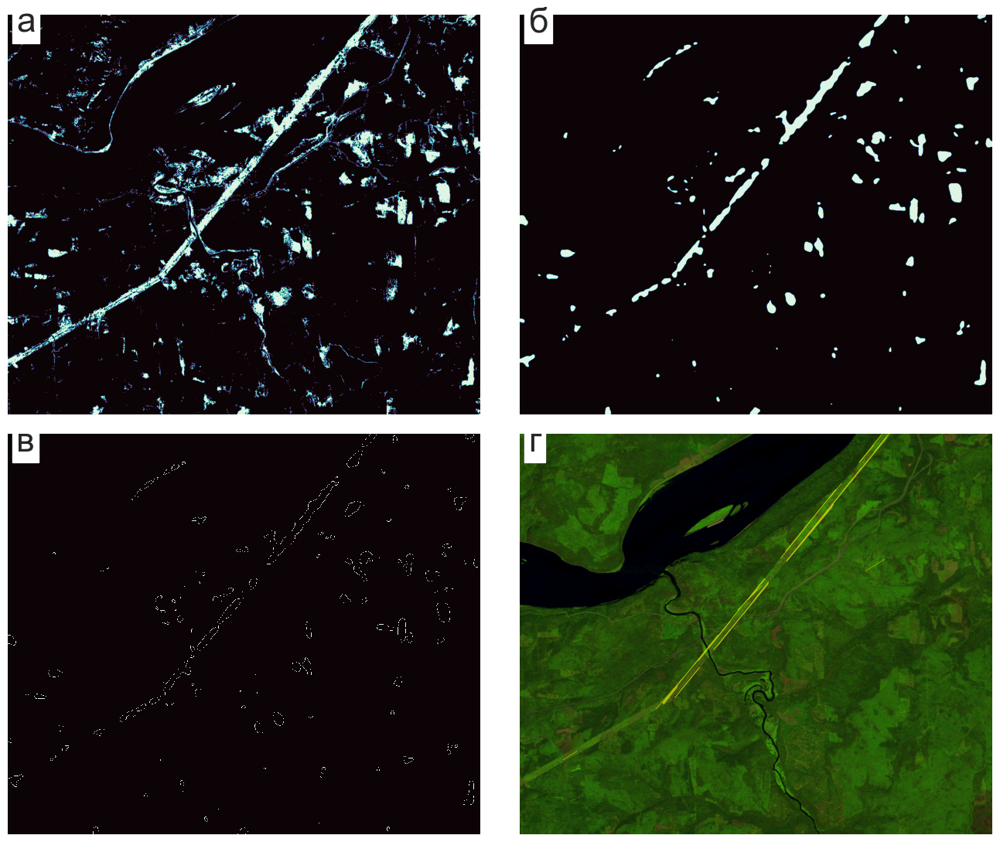

In [ ]:
clearings_extractor_extended_1 = ClearingsExtractor()
fig = clearings_extractor_extended_1.visualize_algorithm_steps(
    big_logreg_pred_maps[0], big_summer_images[0]
)
plt.tight_layout()

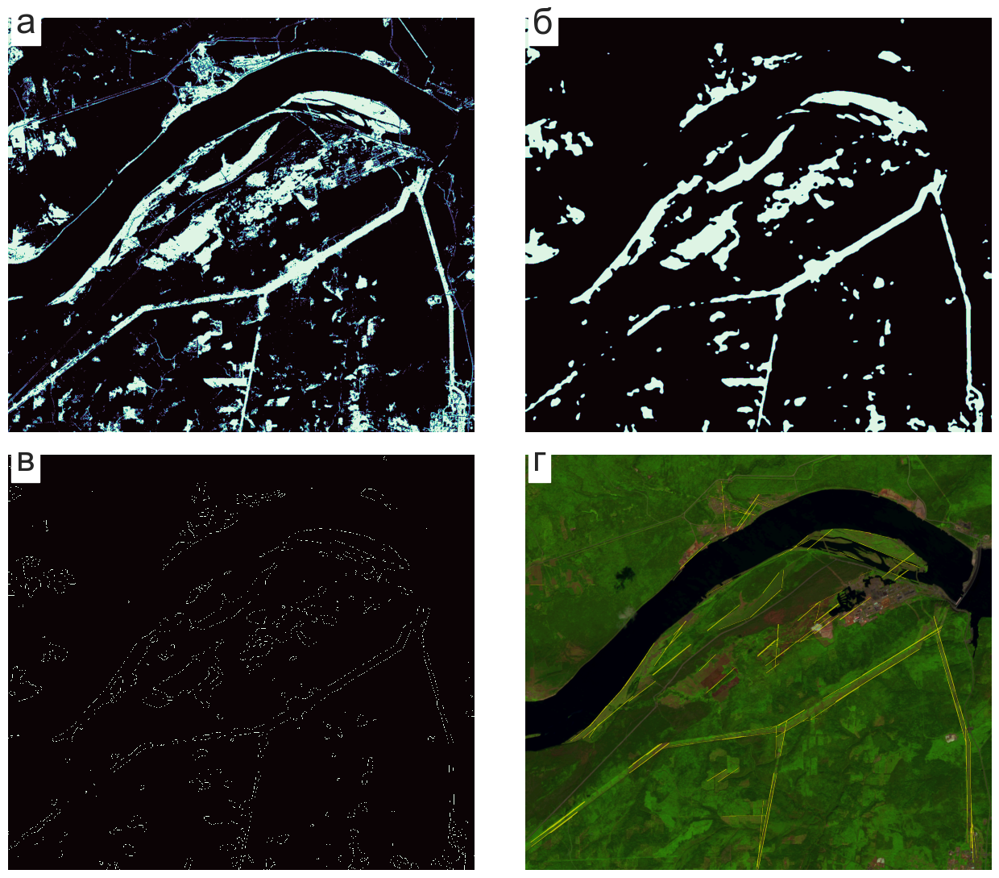

In [ ]:
clearings_extractor_extended_2 = ClearingsExtractor()
fig = clearings_extractor_extended_2.visualize_algorithm_steps(
    big_logreg_pred_maps[1], big_summer_images[1]
)
plt.tight_layout()

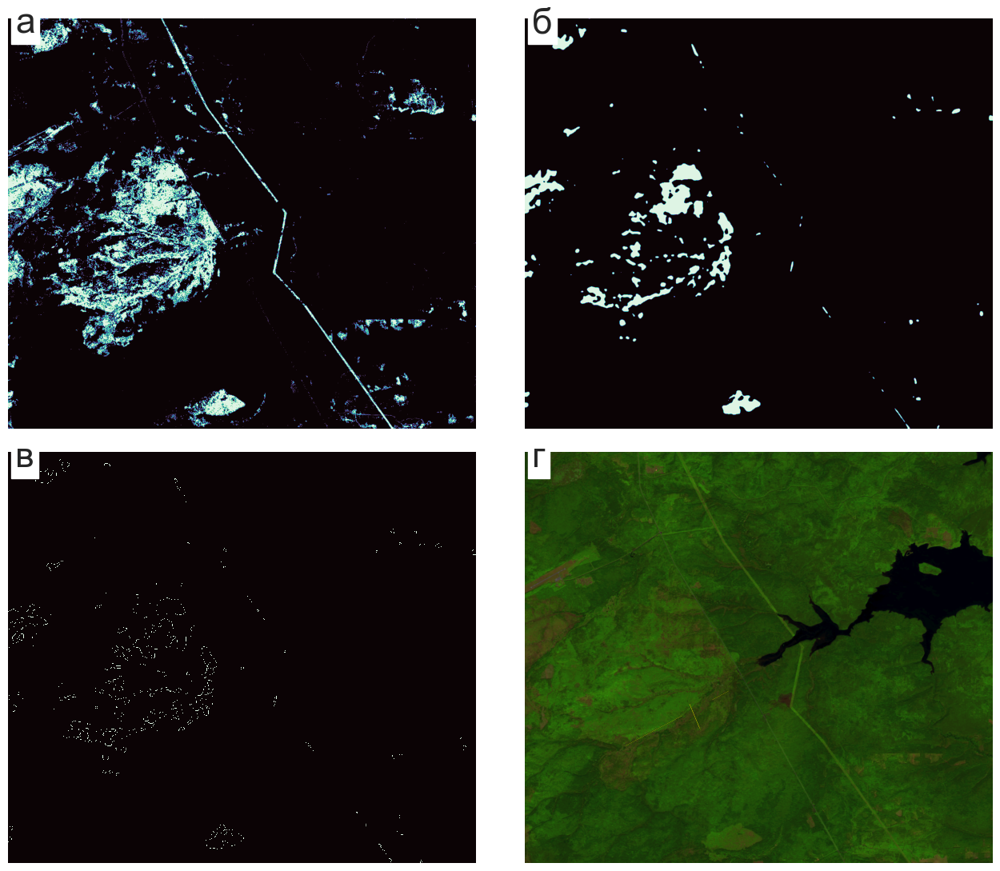

In [ ]:
clearings_extractor_extended_3 = ClearingsExtractor()
fig = clearings_extractor_extended_3.visualize_algorithm_steps(
    big_logreg_pred_maps[2], big_summer_images[2]
)
plt.tight_layout()

Результаты выделения лесных просек можно сохранить в дальнейшем для скачивания на компьютер:

In [ ]:
clearings_predictions = []

for summer_image, winter_image in zip(big_summer_images, big_winter_images):
    clearings = find_clearing_algorithm(summer_image, winter_image, model)
    clearings_predictions.append(clearings)

## Тестирование финального алгоритма на остальной территории исследования

Для дальнейшего тестирования алгоритма подобраны зимние и летние снимки на новых участках. Результаты выделения лесных просек приведены ниже:

In [ ]:
test_summer_images = [
    r".\images\test_images\sentinel2_2017_06_forest.tif",
    r".\images\test_images\sentinel2_2020_06_town.tif",
    r".\images\test_images\sentinel2_2020_07_river.tif",
    r".\images\test_images\sentinel2_2021_06_forest_river.tif",
    r".\images\test_images\sentinel2_2016_06_bare_lands.tif",
    r".\images\test_images\sentinel2_2021_06_roads.tif",
]

test_winter_images = [
    r".\images\test_images\sentinel2_2017_01_forest.tif",
    r".\images\test_images\sentinel2_2021_01_town.tif",
    r".\images\test_images\sentinel2_2021_01_river.tif",
    r".\images\test_images\sentinel2_2021_01_forest_river.tif",
    r".\images\test_images\sentinel2_2017_01_bare_lands.tif",
    r".\images\test_images\sentinel2_2021_01_roads.tif",
]

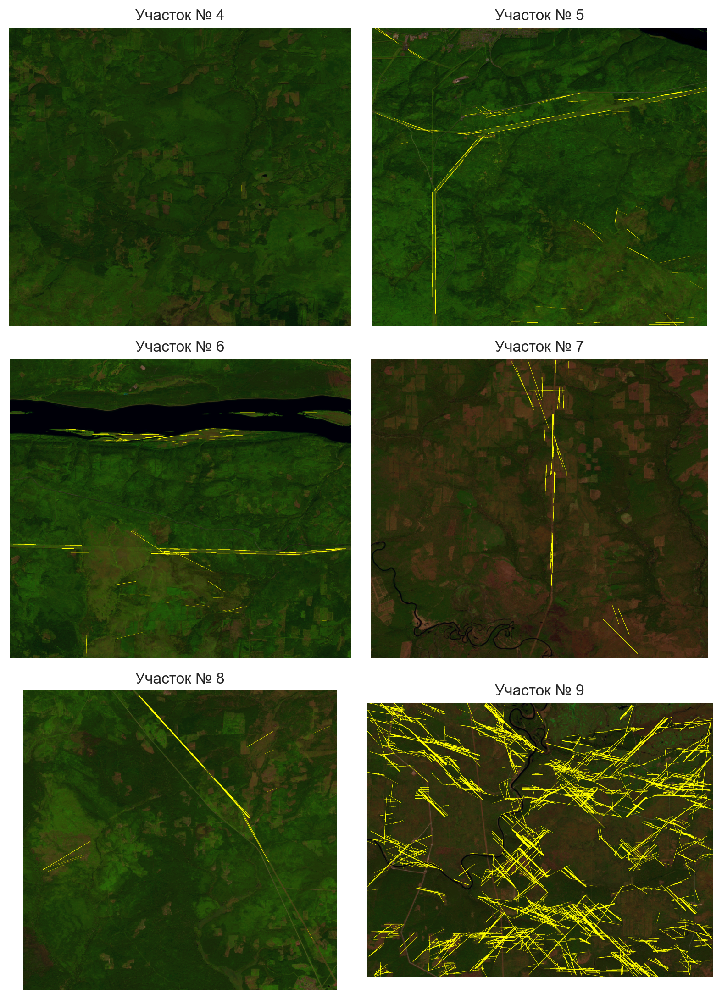

In [ ]:
fig, axs = plt.subplots(ncols=2, nrows=3, figsize=(8, 11), dpi=200)
axs = axs.ravel()
headings = [
    "Участок № 4",
    "Участок № 5",
    "Участок № 6",
    "Участок № 7",
    "Участок № 8",
    "Участок № 9",
]

for url_summer_image, url_winter_image, heading, axis in zip(
    test_summer_images, test_winter_images, headings, axs
):
    clearings = find_clearing_algorithm(url_summer_image, url_winter_image, model)
    rgb = ClearingsExtractor.open_basemap(url_summer_image)
    axis.imshow(rgb * 8)
    axis.imshow(clearings)
    axis.axis("off")
    axis.set_title(heading)
    clearings_predictions.append(clearings)

plt.tight_layout()

## Скачивание результатов в репозиторий

Результаты выделения лесных просек в виде растров с пространственной привязкой можно скачать на компьютер и применить в дальнейшем, например, в ГИС-пакете для пространственного анализа. Для этого необходимо извлечь информацию о системе координат и экстенте растра через снимки на каждый участок:

In [ ]:
all_images = [
    r".\images\experimental_areas_images\big_areas_images\sentinel2_2020_06_1_2.tif",
    r".\images\experimental_areas_images\big_areas_images\sentinel2_2020_06_2_2.tif",
    r".\images\experimental_areas_images\big_areas_images\sentinel2_2020_06_3_2.tif",
    r".\images\test_images\sentinel2_2017_06_forest.tif",
    r".\images\test_images\sentinel2_2020_06_town.tif",
    r".\images\test_images\sentinel2_2020_07_river.tif",
    r".\images\test_images\sentinel2_2021_06_forest_river.tif",
    r".\images\test_images\sentinel2_2016_06_bare_lands.tif",
    r".\images\test_images\sentinel2_2021_06_roads.tif",
]

In [ ]:
# перед запуском текущей ячейки необходимо удалить файлы из папки results
for img, result, num in zip(all_images, clearings_predictions, list(range(1, 10))):
    img = rxr.open_rasterio(img)
    transform = img.rio.bounds()
    y = img.shape[1]
    x = img.shape[2]
    nbands = 4
    dtype = gdal.GDT_Byte
    driver = gdal.GetDriverByName("GTiff")
    dummy_url = f"./results/dummy_{num}.tif"
    memory_driver = driver.Create(dummy_url, x, y, nbands, dtype)
    spatref = osr.SpatialReference()
    spatref.ImportFromEPSG(32647)
    wkt = spatref.ExportToWkt()
    memory_driver.SetProjection(wkt)
    memory_driver.SetGeoTransform([transform[0], 10, 0, transform[-1], 0, -10])
    memory_driver = None
    result_url = f"./results/result_{num}.tif"
    rasterio.shutil.copy(dummy_url, result_url)

    with rxr.open_rasterio(dummy_url) as tif_file:
        power_line_clearings = tif_file.load()
        for b in range(4):
            power_line_clearings[b, :, :] = result[:, :, b]
        power_line_clearings.rio.to_raster(result_url, compress="zlib")

    gdal.Unlink(dummy_url)